In [ ]:
%matplotlib inline
from pathlib import Path

DATASET_PATH = Path("../dataset/")
TRAIN_DATA_PATH = DATASET_PATH / "train.csv"
TEST_DATA_PATH = DATASET_PATH / "test.csv"
SUBMIT_DATA_PATH = DATASET_PATH / "sample_submit.csv"

In [2]:
from ydata_profiling import ProfileReport
import polars as pl

In [3]:
train_df = pl.read_csv(TRAIN_DATA_PATH)
test_df = pl.read_csv(TEST_DATA_PATH)
submit_df = pl.read_csv(SUBMIT_DATA_PATH)

In [4]:
train_profile = ProfileReport(train_df.to_pandas())
test_profile = ProfileReport(test_df.to_pandas())

In [5]:
train_profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
test_profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

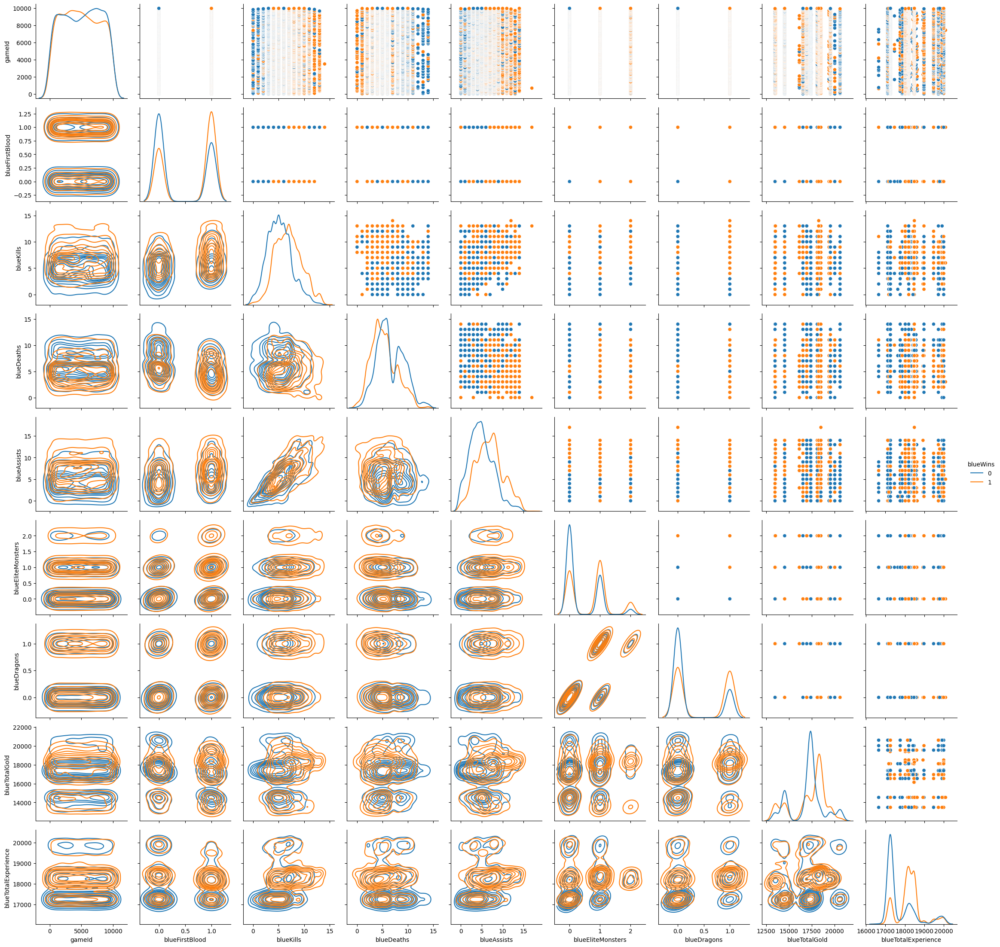

In [7]:
import seaborn as sns

g = sns.PairGrid(train_df.to_pandas(), hue="blueWins", diag_sharey=False)
g.map_upper(sns.scatterplot)
g.map_diag(sns.kdeplot)
g.map_lower(sns.kdeplot)

g.add_legend()

In [8]:
ProfileReport(train_df.filter(pl.col("blueKills") == 0).to_pandas())

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
ProfileReport(train_df.filter(pl.col("blueDeaths") == 0).to_pandas())

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [19]:
import xfeat

pipeline = xfeat.ConcatCombination(
    input_cols=["blueHerald", "blueDragons", "blueWins"],
    r=2,
)

tmp_df = (
    train_df.with_columns(
        (pl.col("blueEliteMonsters") - pl.col("blueDragons")).alias("blueHerald")
    )
    .drop("blueEliteMonsters")
    .with_columns(pl.col((["blueHerald", "blueDragons", "blueWins"])).cast(pl.String))
)

tmp_df = pl.from_pandas(pipeline.fit_transform(tmp_df.to_pandas()))



In [21]:
tmp_df

gameId,blueFirstBlood,blueKills,blueDeaths,blueAssists,blueDragons,blueTotalGold,blueTotalExperience,blueWins,blueHerald,blueHeraldblueDragons_combi,blueHeraldblueWins_combi,blueDragonsblueWins_combi
i64,i64,i64,i64,i64,str,i64,i64,str,str,str,str,str
0,0,5,8,6,"""0""",14536,17256,"""0""","""0""","""00""","""00""","""00"""
1,1,10,1,5,"""0""",14536,17863,"""0""","""0""","""00""","""00""","""00"""
2,0,3,10,2,"""0""",17409,17256,"""0""","""0""","""00""","""00""","""00"""
3,1,7,10,8,"""0""",19558,18201,"""0""","""0""","""00""","""00""","""00"""
4,0,4,9,4,"""0""",17409,17256,"""0""","""0""","""00""","""00""","""00"""
5,0,5,10,8,"""0""",17409,19730,"""0""","""0""","""00""","""00""","""00"""
6,0,5,4,6,"""1""",20038,19730,"""0""","""0""","""01""","""00""","""10"""
7,1,8,5,13,"""0""",18274,18491,"""1""","""1""","""10""","""11""","""01"""
8,0,5,6,6,"""0""",14536,18986,"""0""","""1""","""10""","""10""","""00"""


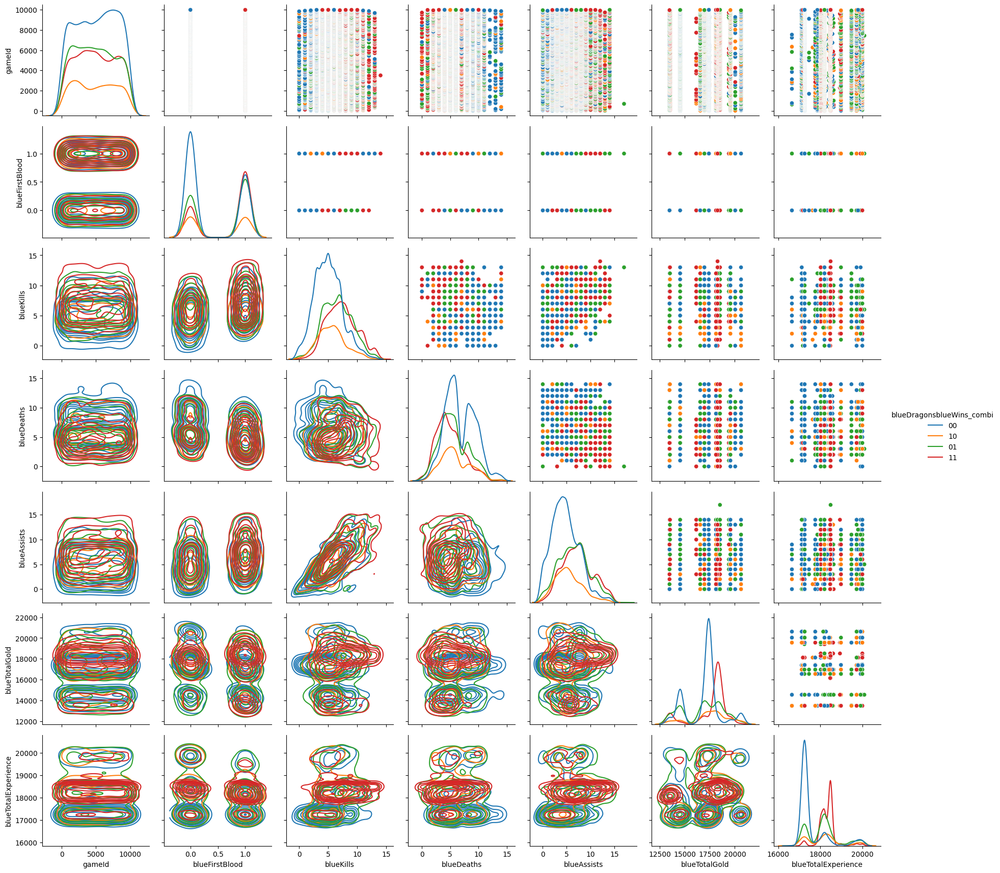

In [22]:
import polars.selectors as cs

g = sns.PairGrid(
    tmp_df.to_pandas(),
    hue="blueDragonsblueWins_combi",
    diag_sharey=False,
    vars=tmp_df.select(cs.numeric()).columns,
)
g.map_upper(sns.scatterplot)
g.map_diag(sns.kdeplot)
g.map_lower(sns.kdeplot)

g.add_legend()
g

/usr/local/lib/python3.10/dist-packages/seaborn/distributions.py:1185: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/usr/local/lib/python3.10/dist-packages/seaborn/distributions.py:1185: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/usr/local/lib/python3.10/dist-packages/seaborn/distributions.py:1185: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/usr/local/lib/python3.10/dist-packages/seaborn/distributions.py:1185: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1609: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  func(x=x, y=y, **kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/distributions.py:1185: UserWarning: No contour levels were found within the data range.
  cset = c

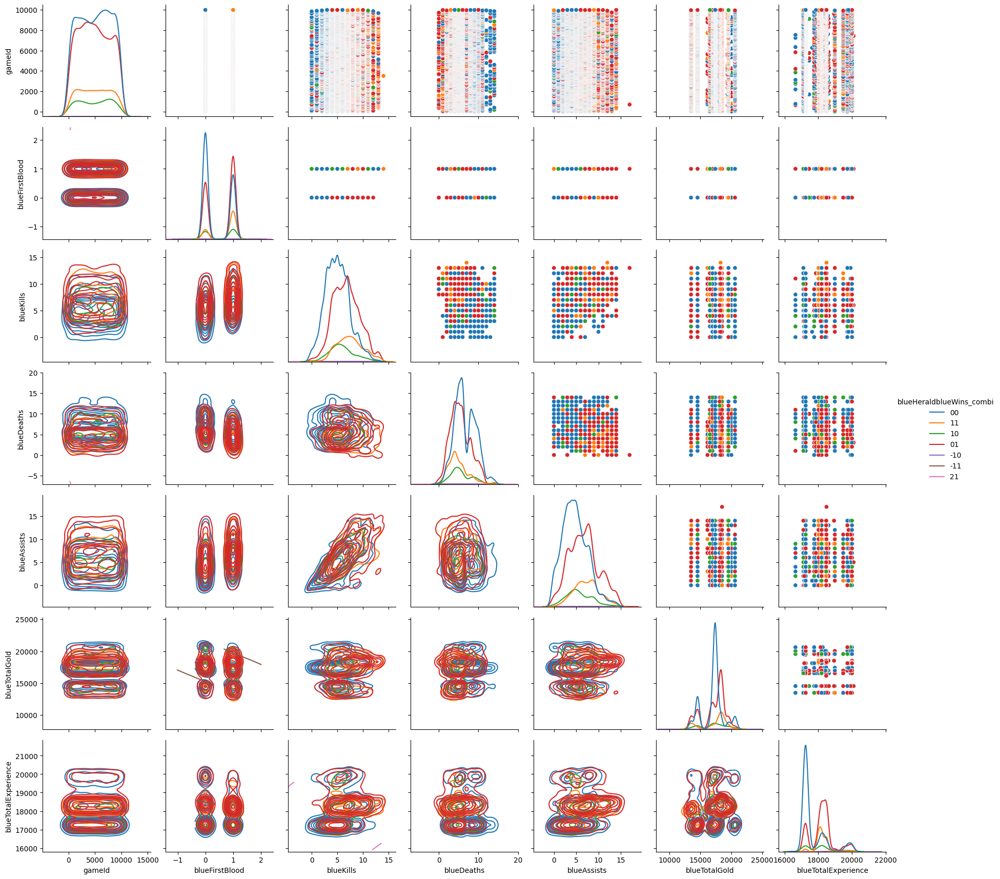

In [23]:
g = sns.PairGrid(
    tmp_df.to_pandas(),
    hue="blueHeraldblueWins_combi",
    diag_sharey=False,
    vars=tmp_df.select(cs.numeric()).columns,
)
g.map_upper(sns.scatterplot)
g.map_diag(sns.kdeplot)
g.map_lower(sns.kdeplot)

g.add_legend()
g